In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.tree import DecisionTreeRegressor,DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.svm import SVC,SVR


from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import mean_squared_error,mean_absolute_error, r2_score

from sklearn.model_selection import cross_val_score
import joblib

import warnings
warnings.filterwarnings("ignore")

In [2]:
#show all rows and columns 
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [3]:
df=pd.read_csv("weatherAUS.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,W,20.0,24.0,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,6.0,17.0,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,SSE,15.0,11.0,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


In [4]:
df.shape

(8425, 23)

In [5]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [7]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [8]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

                                             |                                             | [  0%]   00:00 ->…


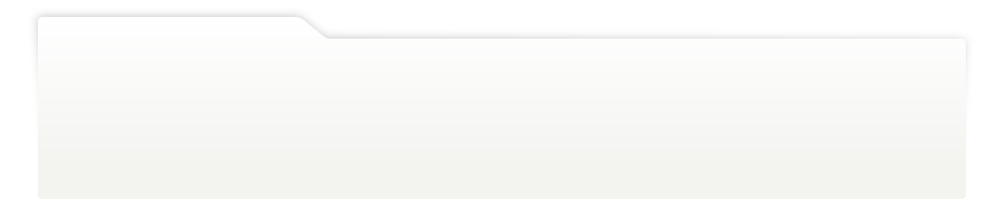
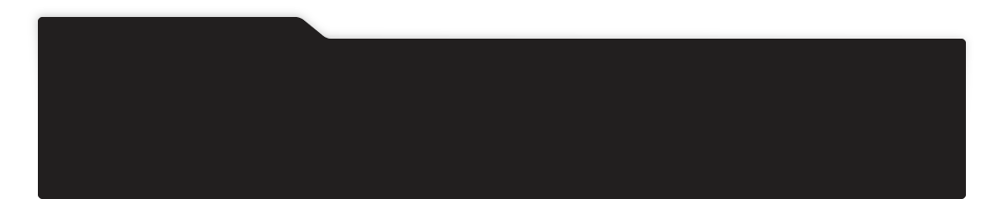
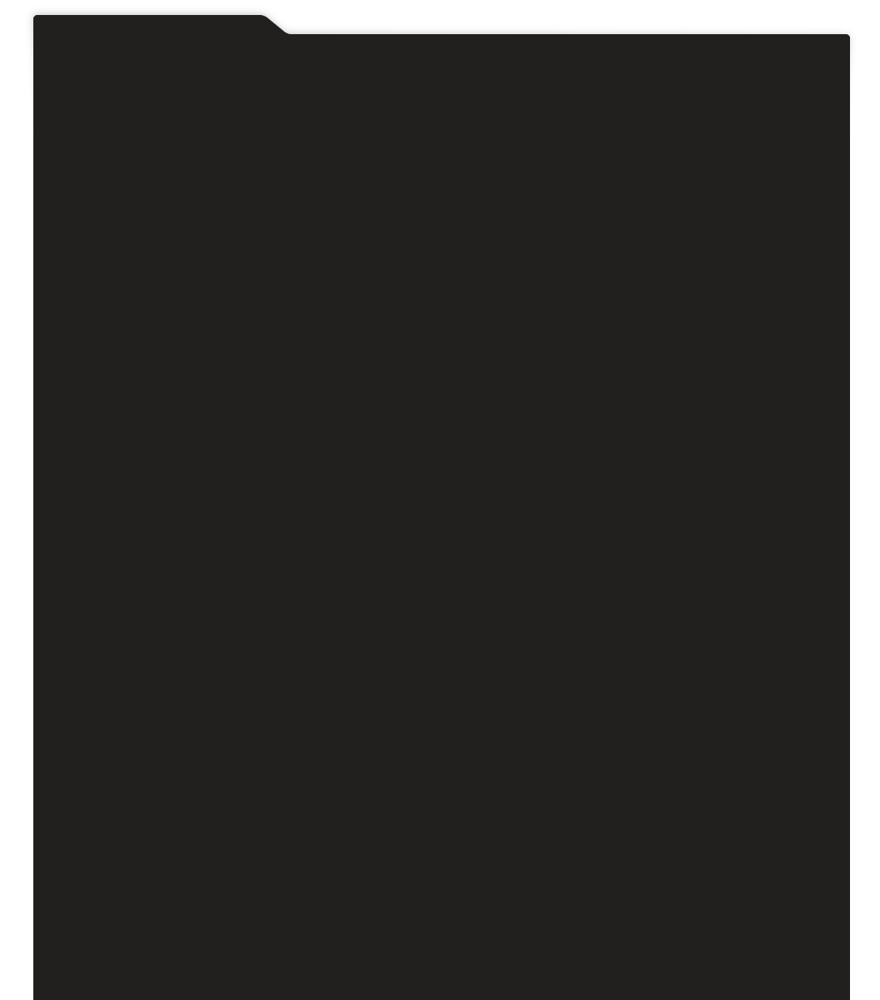
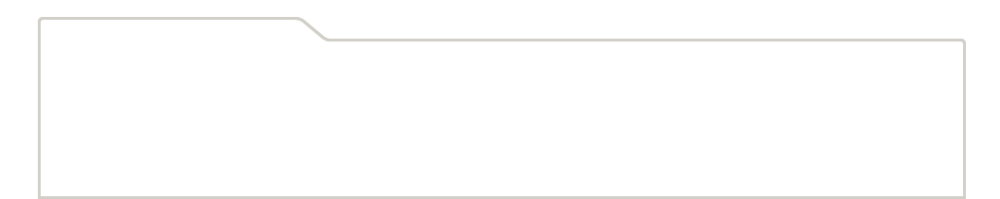
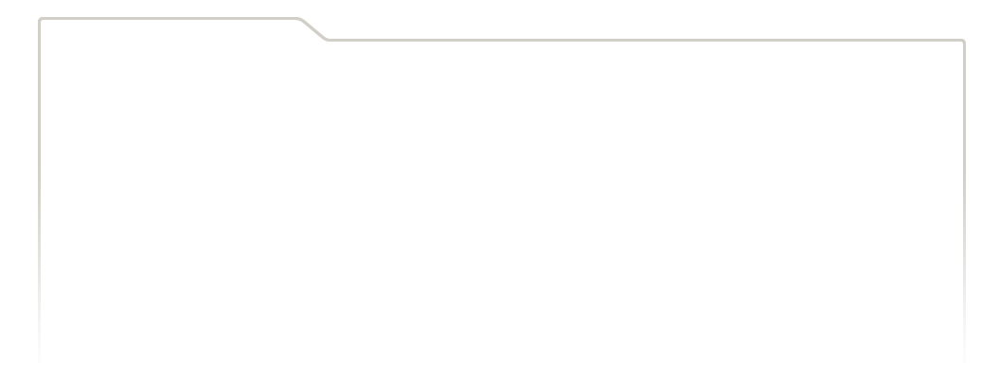
...
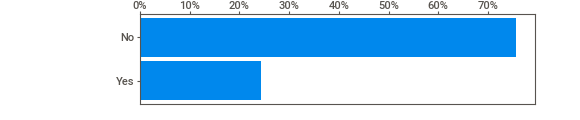
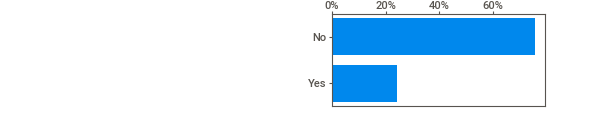
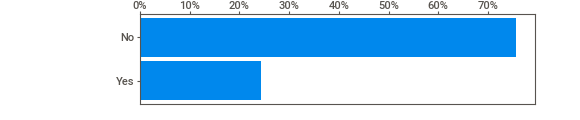
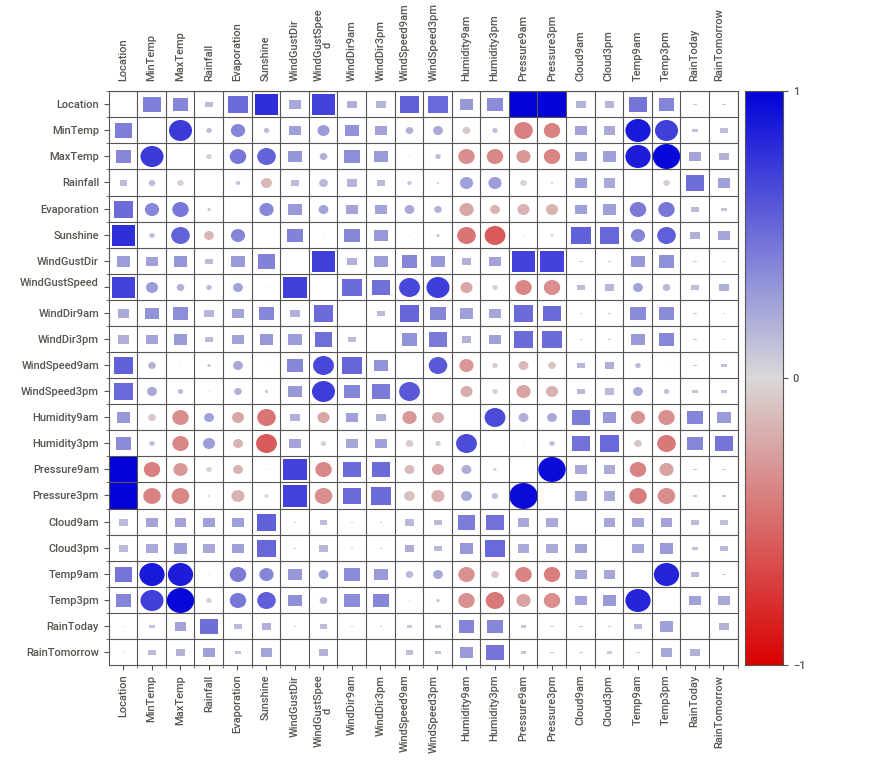
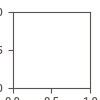

In [9]:
import sweetviz as sw
report = sw.analyze(df)
report.show_notebook(layout='vertical')


In [10]:
#dropping some of the columns that are not needed
df.drop(columns=['Date','Evaporation','Sunshine','Cloud9am','Cloud3pm'],axis=1,inplace=True)

In [11]:
categ=df.select_dtypes(include='object')
num=df.select_dtypes(exclude='object')


In [12]:
#filling categorical null data with mode
for i in categ.columns:
    df[i].fillna(df[i].mode()[0],inplace=True)

In [13]:
#filling numerical null data with median
for i in num.columns:
    df[i].fillna(df[i].median(),inplace=True)

No     6434
Yes    1991
Name: RainTomorrow, dtype: int64

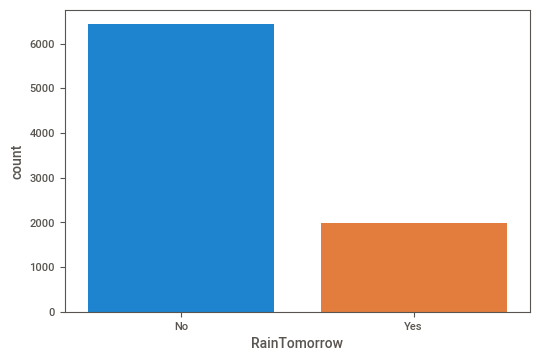

In [14]:
sns.countplot(df['RainTomorrow'],data=df)
df['RainTomorrow'].value_counts()

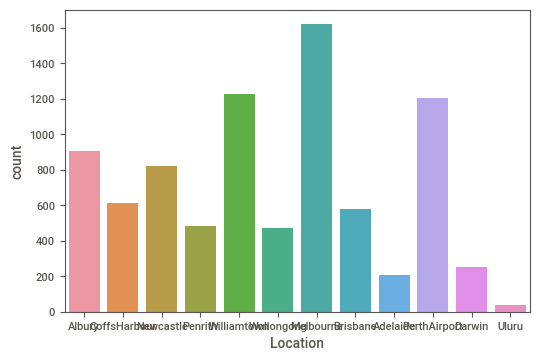

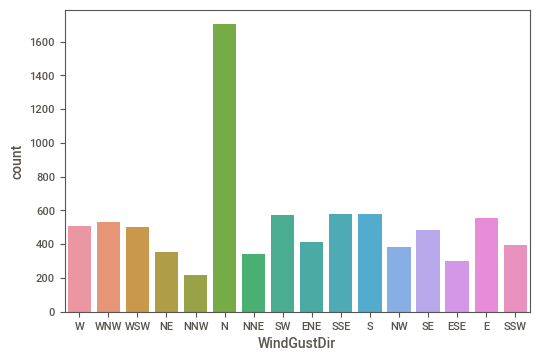

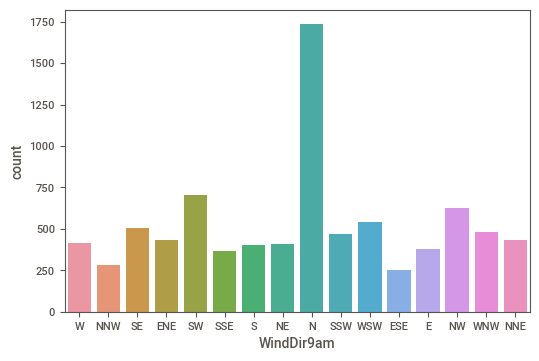

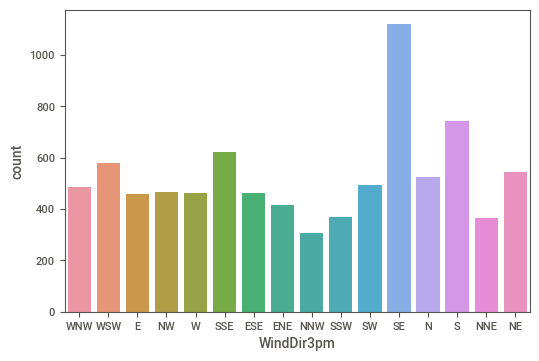

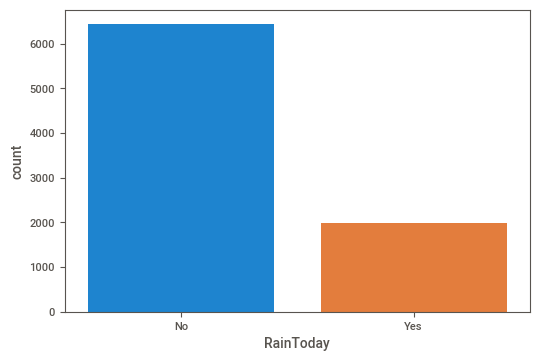

In [15]:
for i in ['Location','WindGustDir', 'WindDir9am', 'WindDir3pm','RainToday']:
    sns.countplot(df[i],data=df)
    plt.show()

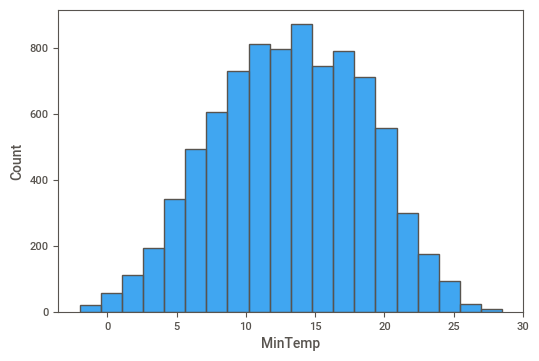

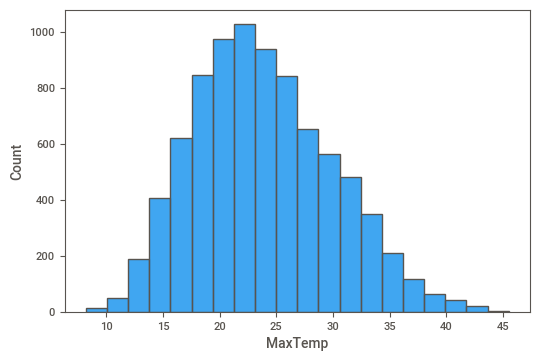

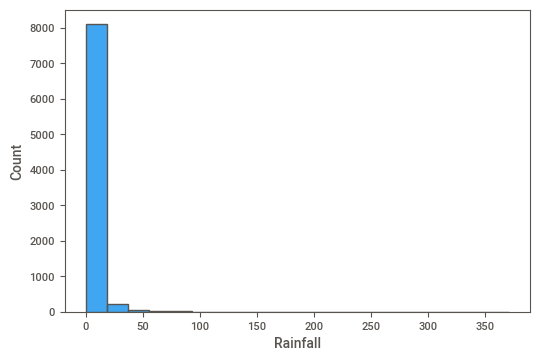

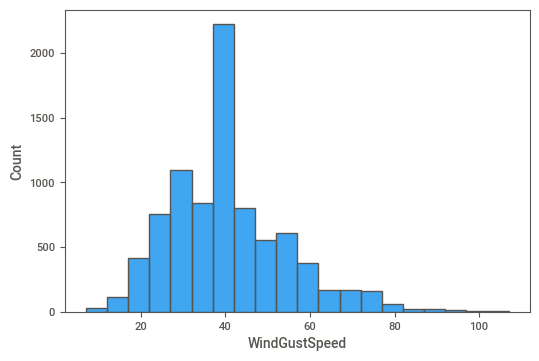

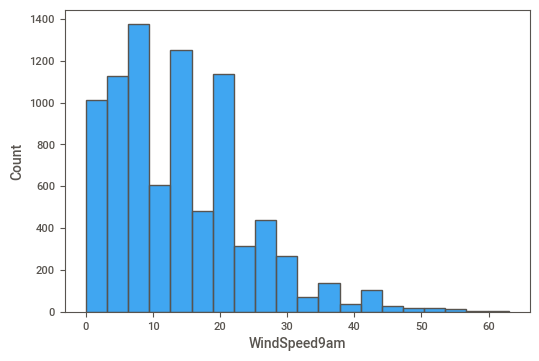

...

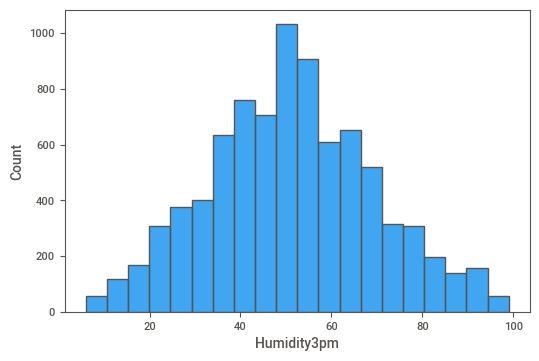

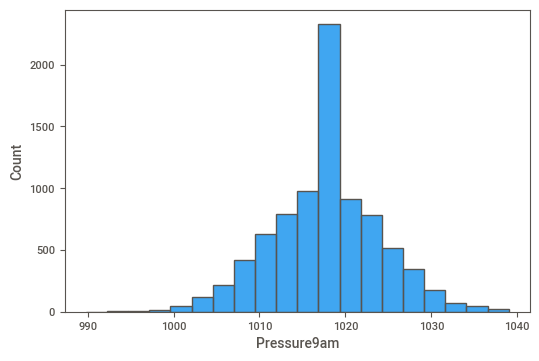

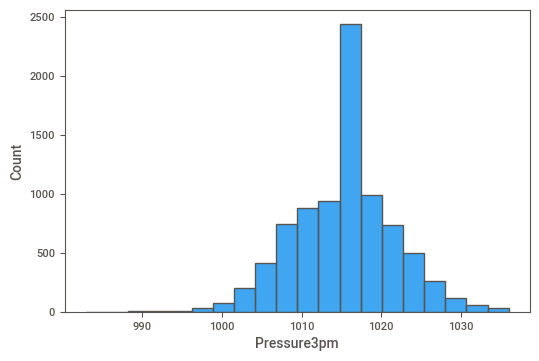

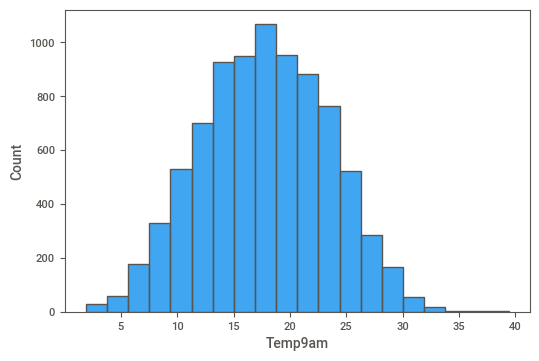

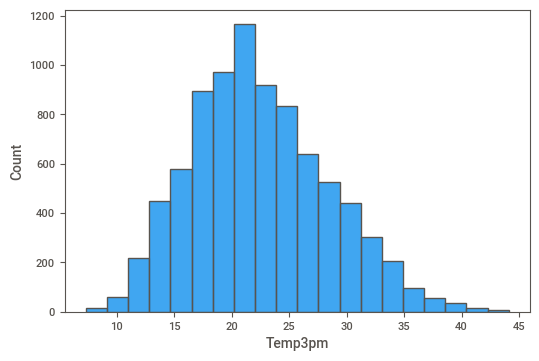

In [16]:
for i in ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am','WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am','Pressure3pm', 'Temp9am', 'Temp3pm']:
    sns.histplot(df[i],bins=20)
    plt.show()

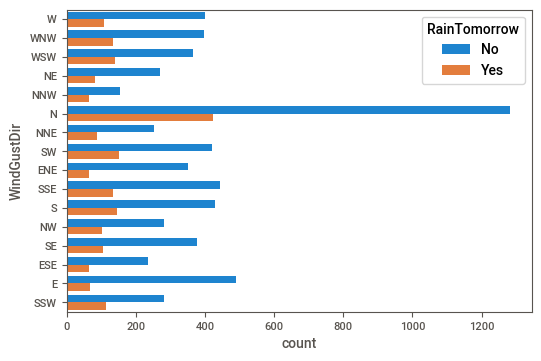

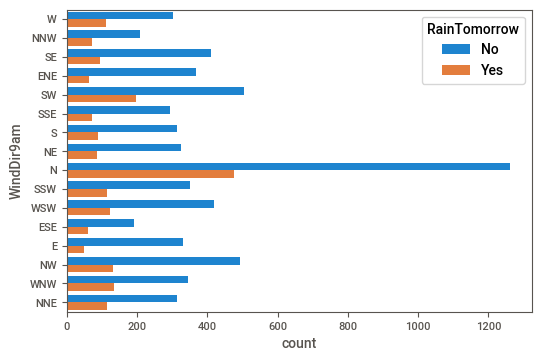

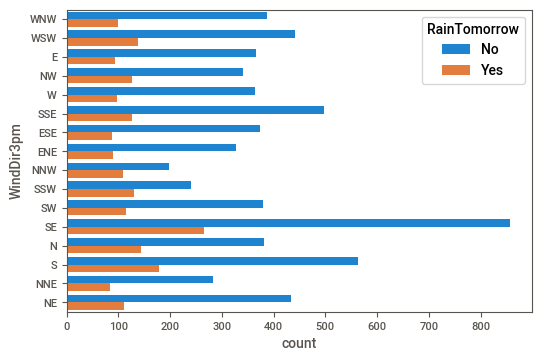

In [17]:
for i in ['WindGustDir','WindDir9am','WindDir3pm']:
    sns.countplot(y=i,hue='RainTomorrow',data=df)
    plt.show()

RainTomorrow:
    -WindGustDir North Direction
    -WindDir9am North direction
    -WindDir3pm South east direction

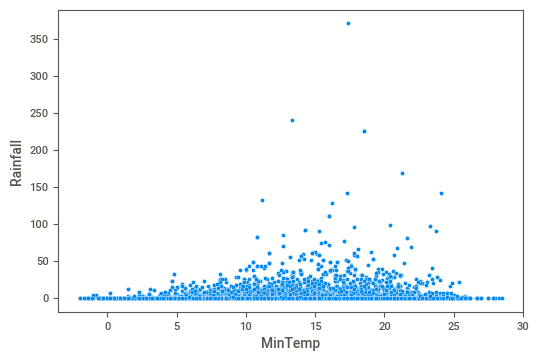

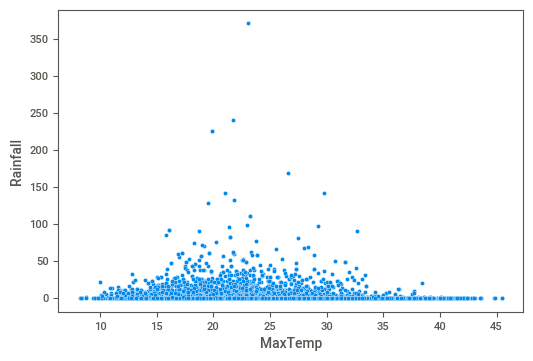

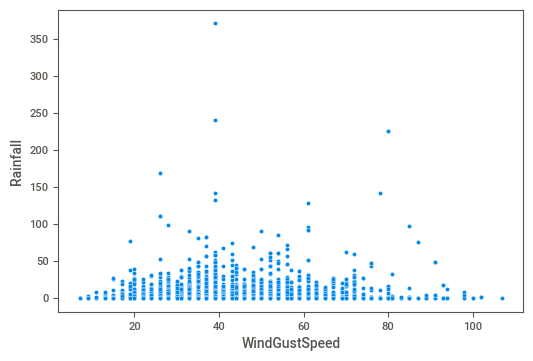

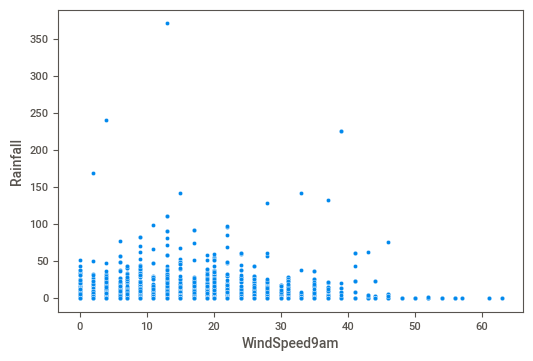

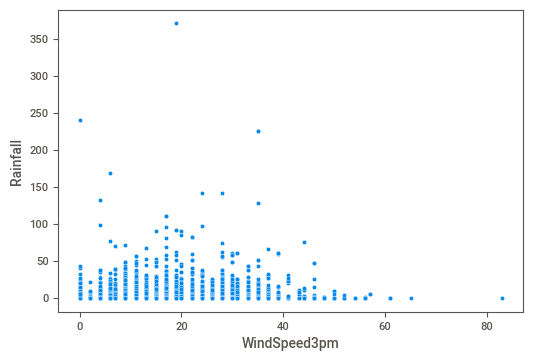

...

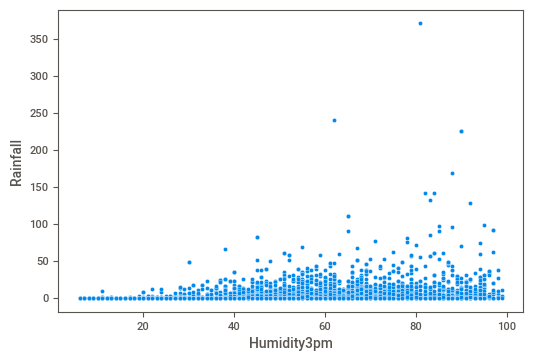

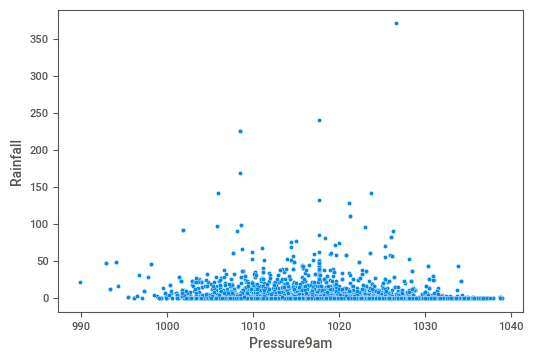

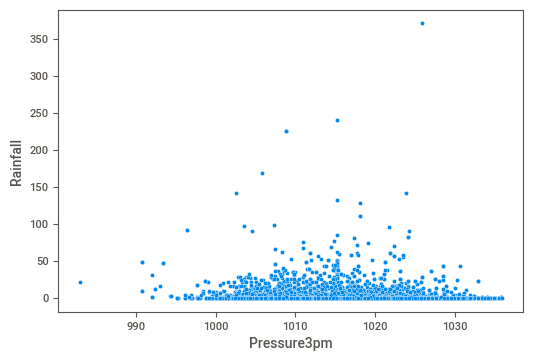

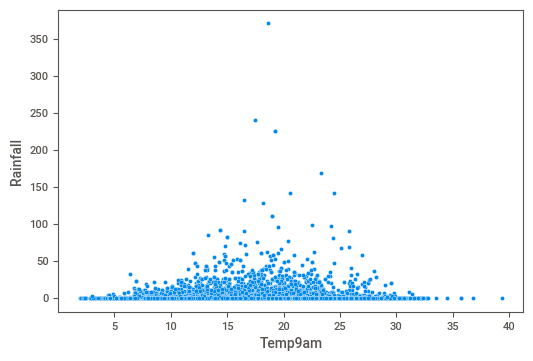

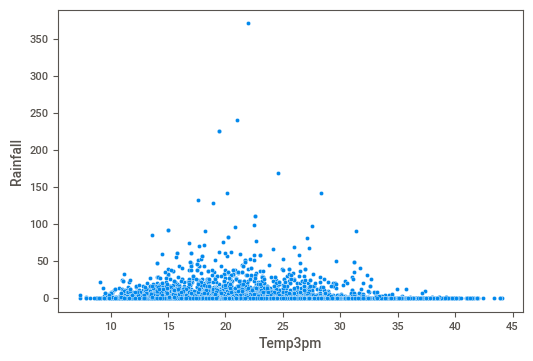

In [18]:
for i in ['MinTemp','MaxTemp','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Temp9am','Temp3pm']:
    sns.scatterplot(x=i,y='Rainfall',data=df)
    plt.show()

-As per above data rainfall should be between 200-300.

In [19]:
# Perform label encoding for categorical columns
label_encoder = LabelEncoder()
for col in categ:
    df[col] = label_encoder.fit_transform(df[col])

# Perform standard scaling for numerical columns
scaler = StandardScaler()
df[num.columns] = scaler.fit_transform(df[num.columns])

In [20]:
# Split the data into features and target variable
x = df.drop(['RainTomorrow'], axis=1)
y = df['RainTomorrow']

In [21]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=.30,random_state=32)
print("xtrain shape:",xtrain.shape)
print("xtest shape:",xtest.shape)
print("ytrain shape:",ytrain.shape)
print("ytest shape:",ytest.shape)

xtrain shape: (5897, 17)
xtest shape: (2528, 17)
ytrain shape: (5897,)
ytest shape: (2528,)


classification model to predict whether or not it will rain tomorrow

In [22]:
lr= LogisticRegression()
lr.fit(xtrain, ytrain)
ypred = lr.predict(xtest)

print("Accuracy {0:.2f}%".format(100*accuracy_score(ypred, ytest)))
print(confusion_matrix(ytest, ypred))
print(classification_report(ytest, ypred))

scores = cross_val_score(lr, x,y, cv=5)
print("Scores:", scores)
print("Mean score:", scores.mean())
print("Standard deviation:", scores.std())

Accuracy 82.67%
[[1838  119]
 [ 319  252]]
              precision    recall  f1-score   support

           0       0.85      0.94      0.89      1957
           1       0.68      0.44      0.54       571

    accuracy                           0.83      2528
   macro avg       0.77      0.69      0.71      2528
weighted avg       0.81      0.83      0.81      2528

Scores: [0.84807122 0.79703264 0.78872404 0.81186944 0.85459941]
Mean score: 0.8200593471810089
Standard deviation: 0.026671655824463427


In [23]:
dtc = DecisionTreeClassifier()
dtc.fit(xtrain, ytrain)
ypred = dtc.predict(xtest)

print("Accuracy {0:.2f}%".format(100*accuracy_score(ypred, ytest)))
print(confusion_matrix(ytest, ypred))
print(classification_report(ytest, ypred))

scores = cross_val_score(dtc, x,y, cv=5)
print("Scores:", scores)
print("Mean score:", scores.mean())
print("Standard deviation:", scores.std())

Accuracy 84.53%
[[1755  202]
 [ 189  382]]
              precision    recall  f1-score   support

           0       0.90      0.90      0.90      1957
           1       0.65      0.67      0.66       571

    accuracy                           0.85      2528
   macro avg       0.78      0.78      0.78      2528
weighted avg       0.85      0.85      0.85      2528

Scores: [0.74777448 0.83857567 0.85875371 0.77091988 0.77032641]
Mean score: 0.7972700296735905
Standard deviation: 0.04325851807767099


In [24]:
rfc = RandomForestClassifier()
rfc.fit(xtrain, ytrain)
ypred = rfc.predict(xtest)

print("Accuracy {0:.2f}%".format(100*accuracy_score(ypred, ytest)))
print(confusion_matrix(ytest, ypred))
print(classification_report(ytest, ypred))

scores = cross_val_score(rfc, x,y, cv=5)
print("Scores:", scores)
print("Mean score:", scores.mean())
print("Standard deviation:", scores.std())

Accuracy 88.65%
[[1883   74]
 [ 213  358]]
              precision    recall  f1-score   support

           0       0.90      0.96      0.93      1957
           1       0.83      0.63      0.71       571

    accuracy                           0.89      2528
   macro avg       0.86      0.79      0.82      2528
weighted avg       0.88      0.89      0.88      2528

Scores: [0.84807122 0.85519288 0.89080119 0.81958457 0.85519288]
Mean score: 0.8537685459940653
Standard deviation: 0.02270012218470158


In [25]:
svc = SVC()
svc.fit(xtrain, ytrain)
ypred = svc.predict(xtest)

print("Accuracy {0:.2f}%".format(100*accuracy_score(ypred, ytest)))
print(confusion_matrix(ytest, ypred))
print(classification_report(ytest, ypred))

scores = cross_val_score(svc, x,y, cv=5)
print("Scores:", scores)
print("Mean score:", scores.mean())
print("Standard deviation:", scores.std())

Accuracy 83.74%
[[1894   63]
 [ 348  223]]
              precision    recall  f1-score   support

           0       0.84      0.97      0.90      1957
           1       0.78      0.39      0.52       571

    accuracy                           0.84      2528
   macro avg       0.81      0.68      0.71      2528
weighted avg       0.83      0.84      0.82      2528

Scores: [0.85341246 0.80237389 0.79347181 0.80593472 0.83738872]
Mean score: 0.8185163204747775
Standard deviation: 0.02289109321272391


RANDOMFOREST CLASSIFIER HAVE HIGH ACCURACY OF 88.69%

In [26]:
import joblib

rf = RandomForestClassifier()
rf.fit(xtrain, ytrain)

# Save the model to a file
joblib.dump(rf, 'Raintomorrow.joblib')

# Load the model from a file
loaded_model = joblib.load('Raintomorrow.joblib')

# Use the loaded model to make predictions
ypred = loaded_model.predict(xtest)

In [27]:
rainfalltomorrow=pd.DataFrame({'Rainfalltomorrow':ytest,'predicted rainfalltomorrow':ypred},columns=['Rainfalltomorrow','predicted rainfalltomorrow'])
rainfalltomorrow

,Rainfalltomorrow,predicted rainfalltomorrow
3823,0,0
8309,0,0
1275,1,0
2864,0,0
8077,0,0
3408,0,0
1095,0,0
6225,0,0
5386,1,1
4534,0,0


In [28]:
x=df.drop(['Rainfall'],axis=1)
y=df['Rainfall']

In [29]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=.30,random_state=32)
print("xtrain shape:",xtrain.shape)
print("xtest shape:",xtest.shape)
print("ytrain shape:",ytrain.shape)
print("ytest shape:",ytest.shape)

xtrain shape: (5897, 17)
xtest shape: (2528, 17)
ytrain shape: (5897,)
ytest shape: (2528,)


regression model to predict how much rainfall could be there

In [30]:
lr= LinearRegression()
lr.fit(xtrain, ytrain)
ypred = lr.predict(xtest)

print("Mean Absolute Error:",mean_absolute_error(ytest,ypred))
print("Mean Squared Error:",mean_squared_error(ytest,ypred))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(ytest,ypred)))

scores = cross_val_score(lr, x,y, cv=5)
print("Scores:", scores)
print("Mean score:", scores.mean())
print("Standard deviation:", scores.std())

Mean Absolute Error: 0.286912558878927
Mean Squared Error: 0.5877081478948989
Root Mean Squared Error: 0.7666212545285311
Scores: [0.18208875 0.20055581 0.26626707 0.25349202 0.34276043]
Mean score: 0.2490328185382978
Standard deviation: 0.05645050517443625


In [31]:
dtc = DecisionTreeRegressor()
dtc.fit(xtrain, ytrain)
ypred = dtc.predict(xtest)

print("Mean Absolute Error:",mean_absolute_error(ytest,ypred))
print("Mean Squared Error:",mean_squared_error(ytest,ypred))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(ytest,ypred)))

scores = cross_val_score(dtc, x,y, cv=5)
print("Scores:", scores)
print("Mean score:", scores.mean())
print("Standard deviation:", scores.std())

Mean Absolute Error: 0.19833183528791645
Mean Squared Error: 0.8741603696137431
Root Mean Squared Error: 0.9349654376573195
Scores: [-0.05959768  0.41028922  0.40561989  0.16675949 -0.34722526]
Mean score: 0.11516913141591642
Standard deviation: 0.2892995274129868


In [32]:
svc = SVR()
svc.fit(xtrain, ytrain)
ypred = svc.predict(xtest)

print("Mean Absolute Error:",mean_absolute_error(ytest,ypred))
print("Mean Squared Error:",mean_squared_error(ytest,ypred))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(ytest,ypred)))

scores = cross_val_score(svc, x,y, cv=5)
print("Scores:", scores)
print("Mean score:", scores.mean())
print("Standard deviation:", scores.std())

Mean Absolute Error: 0.20725493989771332
Mean Squared Error: 0.6474238731996141
Root Mean Squared Error: 0.8046265426889758
Scores: [0.09938193 0.14309973 0.18665455 0.22507697 0.26284612]
Mean score: 0.1834118582911344
Standard deviation: 0.057866043310899375


In [33]:
rfc = RandomForestRegressor()
rfc.fit(xtrain, ytrain)
ypred = rfc.predict(xtest)

print("Mean Absolute Error:",mean_absolute_error(ytest,ypred))
print("Mean Squared Error:",mean_squared_error(ytest,ypred))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(ytest,ypred)))

scores = cross_val_score(rfc, x,y, cv=5)
print("Scores:", scores)
print("Mean score:", scores.mean())
print("Standard deviation:", scores.std())

Mean Absolute Error: 0.1741113088371105
Mean Squared Error: 0.3111909418691835
Root Mean Squared Error: 0.5578449084370883
Scores: [0.19369893 0.50586666 0.65577645 0.42907532 0.5334283 ]
Mean score: 0.4635691318492833
Standard deviation: 0.15338369359760012


-RANDOM FOREST REGRESSION HAVE LOW ROOT MEAN SQUARE BEST MODEL TO PREDICT HOW MUCH RAINFALL 

In [34]:
rainfall=pd.DataFrame({'Rainfall':ytest,'predicted rainfall':ypred},columns=['Rainfall','predicted rainfall'])
rainfall

,Rainfall,predicted rainfall
3823,-0.167258,-0.238194
8309,-0.264165,-0.263002
1275,2.061584,2.822685
2864,-0.264165,-0.264165
8077,-0.264165,-0.258738
3408,-0.244783,-0.245946
1095,-0.264165,-0.262517
6225,-0.264165,-0.263195
5386,0.763041,0.762072
4534,-0.264165,-0.263389
